In [1]:
]activate .

In [2]:
using Parameters
using StaticArrays

@inbounds @inline function ż(z, p, t)
    @unpack A, B, D = p
    p₀, p₂ = z[SVector{2}(1:2)]
    q₀, q₂ = z[SVector{2}(3:4)]

    return SVector{4}(
        -A * q₀ - 3 * B / √2 * (q₂^2 - q₀^2) - D * q₀ * (q₀^2 + q₂^2),
        -q₂ * (A + 3 * √2 * B * q₀ + D * (q₀^2 + q₂^2)),
        A * p₀,
        A * p₂
    )
end

@inbounds @inline function ṗ(p, q, params, t)
    @unpack A, B, D = params
    dp1 = -A * q[1] - 3 * B / √2 * (q[2]^2 - q[1]^2) - D * q[1] * (q[1]^2 + q[2]^2)
    dp2 = -q[2] * (A + 3 * √2 * B * q[1] + D * (q[1]^2 + q[2]^2))
    return SVector{2}(dp1, dp2)
end

@inbounds @inline function q̇(p, q, params, t)
    params.A * p
end

q̇ (generic function with 1 method)

I will compare two different implementations for the evolution of 2 parallel trajectories. One implementation is the one from `DynamicalSystemsBase`, which uses vectors of `SVectors` and the other is to use a longer `SVector`.

The motivation for this benchmark is that I expect that longer `SVector`s would need less allocations for low dimensional systems and only 2 parallel trajectories. Also it would be possible to use a wider range of integrators.

In [3]:
using ChaosTools

function create_parallel(f, u)
    u₀ = vcat(u...)

    @inbounds function eom(u::SVector{N}, p, t) where {N}
        idx1 = SVector{N÷2}(1:N÷2)
        idx2 = SVector{N÷2}(N÷2+1:N)
        vcat(f(u[idx1], p, t),
             f(u[idx2], p, t))
    end

    return eom, u₀
end

function create_parallel(ṗ, q̇, p0, q0)
    p₀ = vcat(p0...)
    q₀ = vcat(q0...)

    @inbounds function f1(p::SVector{N}, q::SVector{N}, params, t) where {N}
        idx1 = SVector{N÷2}(1:N÷2)
        idx2 = SVector{N÷2}(N÷2+1:N)
        vcat(ṗ(p[idx1], q[idx1], params, t),
             ṗ(p[idx2], q[idx2], params, t))
    end

    @inbounds function f2(p::SVector{N}, q::SVector{N}, params, t) where {N}
        idx1 = SVector{N÷2}(1:N÷2)
        idx2 = SVector{N÷2}(N÷2+1:N)
        vcat(q̇(p[idx1], q[idx1], params, t),
             q̇(p[idx2], q[idx2], params, t))
    end

    return f1, f2, p₀, q₀
end

function parallel_problem(f, u, tspan, params, cb=nothing)
    peom, u₀ = create_parallel(f, u)
    ODEProblem(peom, u₀, tspan, params, callback=cb)
end

function parallel_problem(ṗ, q̇, p0, q0, tspan, params, cb=nothing)
    f1, f2, p₀, q₀ = create_parallel(ṗ, q̇, p0, q0)
    DynamicalODEProblem(f1, f2, p₀, q₀, tspan, params, callback=cb)
end

function parallel_problem(ds::ChaosTools.CDS, states, tspan)
    peom, st = DynamicalSystemsBase.create_parallel(ds, states)
    ODEProblem(peom, st, tspan, ds.p)
end

parallel_problem (generic function with 5 methods)

The system on which I will test the above assumptions is a Hamiltonian system with

$$
\mathcal{H}\left(p_0,p_2,q_0,q_2\right) = \frac{A}{2} \left(p_0^2 + p_2^2 + q_0^2 + q_2^2\right) + \frac{B}{\sqrt{2}} q_0 \left(3q_2^2 - q_0^2\right) + \frac{D}{4} \left(q_0^2+q_2^2\right)^2
$$

In [4]:
using LinearAlgebra

function T(p, A)
    A / 2 * norm(p)^2
end

function V(q, params)
    @unpack A, B, D = params
    A / 2 * (q[1]^2 + q[2]^2) + B / √2 * q[1] * (3 * q[2]^2 - q[1]^2) + D / 4 * (q[1]^2 + q[2]^2)^2
end

H(p, q, params) = T(p, params.A) + V(q, params)

H (generic function with 1 method)

In [5]:
using BenchmarkTools
using Traceur
using OrdinaryDiffEq

In [6]:
d0 = 1e-9
q0 = SVector{2}([0.0, -4.363920590485035])
p0 = SVector{2}([10.923918825236079, -5.393598858645495])
z0 = vcat(p0, q0)
p = (A=1,B=0.55,D=0.4)
tspan = (0., 100.)
H(p0, q0, p)

120.0

First we compare a single function evaluation and make sure there are no allocations.

In [7]:
f, u0 = create_parallel(ż, [z0, z0.+d0/2])

@benchmark $f($u0, $p, 0.)

BenchmarkTools.Trial: 
  memory estimate:  0 bytes
  allocs estimate:  0
  --------------
  minimum time:     11.397 ns (0.00% GC)
  median time:      11.689 ns (0.00% GC)
  mean time:        11.642 ns (0.00% GC)
  maximum time:     30.685 ns (0.00% GC)
  --------------
  samples:          10000
  evals/sample:     1000

In [8]:
@trace f(u0, p, 0.)

┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, (Core._apply)(StaticArrays.tuple, (Base.getfield)(s, parameters))))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:67
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Length, (getfield)(S, 1)))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:106
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, s))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:66
┌ Warning: y is assigned as Union{Nothing, Tuple{Int64,Int64}}
└ @ abstractarray.jl:836
┌ Warning: x is assigned as Union{Nothing, Tuple{Float64,Tuple{OneTo{Int64},Int64}}}
└ @ tuple.jl:63
┌ Warning: y is assigned as Union{Nothing, Tuple{Int64,Int64}}
└ @ abstractarray.jl:836
┌ Warning: x is assigned as Union{Nothing, Tuple{Float64,Tuple{OneTo{Int64},Int64}}}
└ @ tuple.jl:68
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, s))()
└ @ C:\Users\memo\.julia\packa

8-element SArray{Tuple{8},Float64,1,8}:
 -22.218903604184227
  37.60617806407929 
  10.923918825236079
  -5.393598858645495
 -22.218903603401483
  37.60617805724451 
  10.923918825736079
  -5.393598858145495

The above warnings don't seem to point to any problems in my code.

In [9]:
f1, f2, u1, u2 = create_parallel(ṗ, q̇, [p0, p0.+d0/2], [q0, q0.+d0/2])

@btime $f1($u1, $u2, $p, 0.);
@btime $f2($u1, $u2, $p, 0.);

  7.890 ns (0 allocations: 0 bytes)
  3.506 ns (0 allocations: 0 bytes)


In [10]:
@trace f1(u1, u2, p, 0.)

┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, (Core._apply)(StaticArrays.tuple, (Base.getfield)(s, parameters))))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:67
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Length, (getfield)(S, 1)))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:106
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, s))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:66
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, s))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:65


4-element SArray{Tuple{4},Float64,1,4}:
 -22.218903604184227
  37.60617806407929 
 -22.218903603401483
  37.60617805724451 

In [11]:
@trace f2(u1, u2, p, 0.)

┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, (Core._apply)(StaticArrays.tuple, (Base.getfield)(s, parameters))))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:67
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Length, (getfield)(S, 1)))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:106
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, s))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:66
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, s))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:66
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, s))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:65


4-element SArray{Tuple{4},Float64,1,4}:
 10.923918825236079
 -5.393598858645495
 10.923918825736079
 -5.393598858145495

Again everything seems ok.

In [12]:
ds = ContinuousDynamicalSystem(ż, z0, p)
f_, u0_ = DynamicalSystemsBase.create_parallel(ds, [z0, z0.+d0/2])
du = [rand(SVector{4}), rand(SVector{4})]
@benchmark $f_($du, $u0_, $p, 0.)

BenchmarkTools.Trial: 
  memory estimate:  0 bytes
  allocs estimate:  0
  --------------
  minimum time:     6.429 ns (0.00% GC)
  median time:      6.430 ns (0.00% GC)
  mean time:        6.646 ns (0.00% GC)
  maximum time:     98.484 ns (0.00% GC)
  --------------
  samples:          10000
  evals/sample:     1000

In [13]:
@trace f_(du, u0_, p, 0.)

┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, (Core._apply)(StaticArrays.tuple, (Base.getfield)(s, parameters))))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:67
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Length, (getfield)(S, 1)))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:106
┌ Warning: dynamic dispatch to ((Core.apply_type)(StaticArrays.Size, s))()
└ @ C:\Users\memo\.julia\packages\StaticArrays\Ze5H3\src\traits.jl:66
┌ Warning: y is assigned as Union{Nothing, Tuple{Int64,Int64}}
└ @ abstractarray.jl:836
┌ Warning: x is assigned as Union{Nothing, Tuple{Float64,Tuple{OneTo{Int64},Int64}}}
└ @ tuple.jl:63
┌ Warning: y is assigned as Union{Nothing, Tuple{Int64,Int64}}
└ @ abstractarray.jl:836
┌ Warning: x is assigned as Union{Nothing, Tuple{Float64,Tuple{OneTo{Int64},Int64}}}
└ @ tuple.jl:68


For single function evaluations the method in `DynamicalSystemsBase` is faster.

I will now compare the results of integrating the corresponding problems with and without saving all the steps.

In [14]:
p1 = parallel_problem(ż, [z0, z0.+d0/2], tspan, p)
p2 = parallel_problem(ṗ, q̇, [p0, p0.+d0/2], [q0, q0.+d0/2], tspan, p)
p_ = parallel_problem(ds, [z0, z0.+d0/2], tspan)

ODEProblem with uType Array{SArray{Tuple{4},Float64,1,4},1} and tType Float64. In-place: true
timespan: (0.0, 100.0)
u0: SArray{Tuple{4},Float64,1,4}[[10.9239, -5.3936, 0.0, -4.36392], [10.9239, -5.3936, 5.0e-10, -4.36392]]

### Full solution

In [15]:
@btime solve($p1, Vern9(), abstol=1e-14, reltol=1e-14);
@btime solve($p2, DPRKN12(), abstol=1e-14, reltol=1e-14);
@btime solve($p2, KahanLi8(), dt=1e-2, maxiters=1e10);
@btime solve($p_, Vern9(), abstol=1e-14, reltol=1e-14);

  3.907 ms (38737 allocations: 7.94 MiB)
  3.559 ms (33440 allocations: 1.34 MiB)
  5.550 ms (20077 allocations: 2.91 MiB)
  12.149 ms (290504 allocations: 23.37 MiB)


As we can see, the "longer `SVector`" method is faster and allocated less as expected. We can see that using a specialized integrator, `DPRKN12`, is a bit faster (but this may not be a fair comparison).

### No saving

In [16]:
@btime solve($p1, Vern9(), abstol=1e-14, reltol=1e-14, save_everystep=false);
@btime solve($p2, DPRKN12(), abstol=1e-14, reltol=1e-14, save_everystep=false);
@btime solve($p2, KahanLi8(), dt=1e-2, maxiters=1e10, save_everystep=false);
@btime solve($p_, Vern9(), abstol=1e-14, reltol=1e-14, save_everystep=false);

  3.162 ms (29070 allocations: 1.35 MiB)
  3.445 ms (30385 allocations: 800.94 KiB)
  4.979 ms (77 allocations: 6.94 KiB)
  4.438 ms (118 allocations: 14.92 KiB)


The "longer `SVector`" method is still faster, but not by much. I don't understand why the number of allocations for `Vern9` and `DPRKN12`(with the "longer `SVector`" method) is that high compared with the rest. (I suspect that there may be a type instability somewhere in DiffEq)

We can also compare energy conservation.

In [17]:
s1 = solve(p1, Vern9(), abstol=1e-14, reltol=1e-14)
s2 = solve(p2, DPRKN12(), abstol=1e-14, reltol=1e-14);
s3 = solve(p2, KahanLi8(), dt=1e-2, maxiters=1e10);
s4 = solve(p_, Vern9(), abstol=1e-14, reltol=1e-14);

In [18]:
using Plots

energy_err(sol, offset=0; p0=p0, q0=q0) =
    [abs.(H([sol[offset+1,j], sol[offset+2,j]], [sol[offset+3,j], sol[offset+4,j]],p) - H(p0,q0,p)) for j in axes(sol,2)]
energy_err2(sol) = energy_err(sol, 4, p0=p0.+d0/2, q0=q0.+d0/2)
energy_err_split(sol, offset=0; p0=p0, q0=q0) =
    [abs.(H([sol[offset+1,j], sol[offset+2,j]], [sol[offset+5,j], sol[offset+6,j]],p) - H(p0,q0,p)) for j in axes(sol,2)]
energy_err_split2(sol) = energy_err_split(sol, 2, p0=p0.+d0/2, q0=q0.+d0/2)

err(t,p1,p2,q1,q2;q0=q0,p0=p0) = (t, abs(H([p1,p2],[q1,q2],p)-H(p0,q0,p)))
err2(t,p1,p2,q1,q2) = err(t,p1,p2,q1,q2, p0=p0.+d0/2, q0=q0.+d0/2)
H(p0.+d0/2, q0.+d0/2, p)

119.9999999950715

We will need to compute the energy errors relative to the corresponding initial conditions since the second trajectory has a slightly different energy.

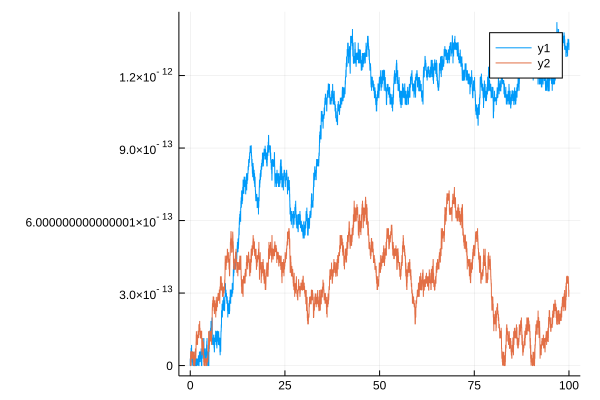

In [19]:
# plot(s1, vars=(err,0,1,2,3,4))
# plot!(s1, vars=(err2,0,5,6,7,8))
plot(s1.t, energy_err(s1))
plot!(s1.t, energy_err2(s1))

Now we check the split ODE form

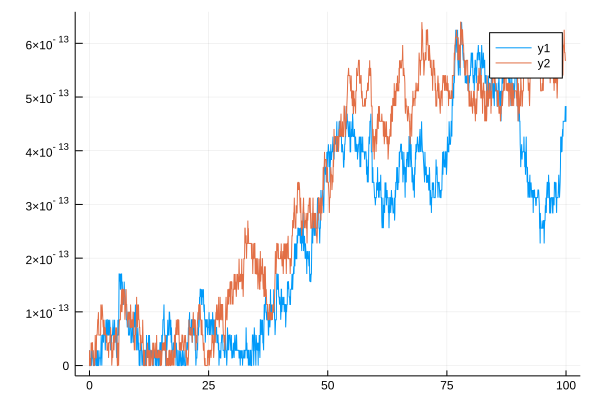

In [20]:
# plot(s2, vars=(err,0,1,2,5,6))
# plot(s2, vars=(err2,0,3,4,7,8))
plot(s2.t, energy_err_split(s2))
plot!(s2.t, energy_err_split2(s2))

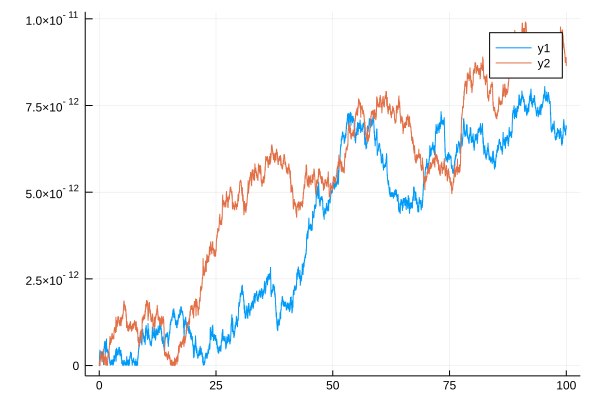

In [21]:
# plot(s3, vars=(err,0,1,2,5,6))
# plot(s3, vars=(err2,0,3,4,7,8))
plot(s3.t, energy_err_split(s3))
plot!(s3.t, energy_err_split2(s3))

And finally the mehod form `DynamicalSystemsBase`

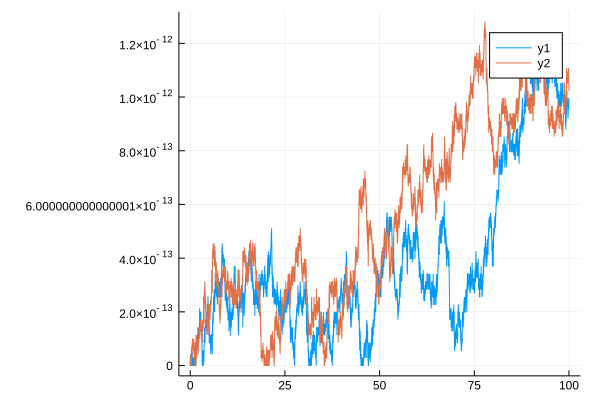

In [22]:
plot([err(s4.t[i], s4.u[i][1][1], s4.u[i][1][2], s4.u[i][1][3], s4.u[i][1][4]) for i in axes(s4,2)])
plot!([err2(s4.t[i], s4.u[i][2][1], s4.u[i][2][2], s4.u[i][2][3], s4.u[i][2][4]) for i in axes(s4,2)])

For a more clear comparison we can look at the energy error for the two implementtions with `Vern9`

1st trajectory: 1.4210854715202004e-12 vs 1.2221335055073723e-12
2nd trajectory: 7.389644451905042e-13 vs 1.2789769243681803e-12


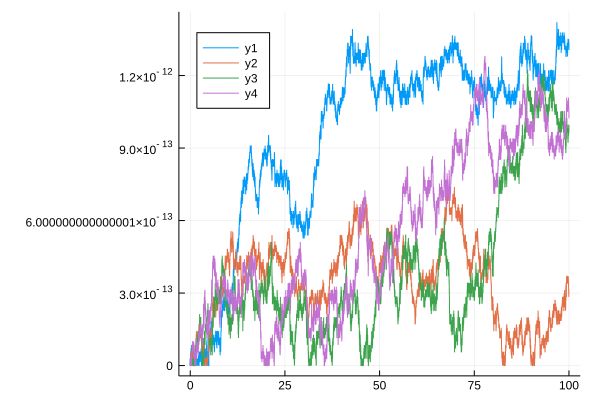

In [23]:
println("1st trajectory: ", maximum(energy_err(s1)), " vs ",
    maximum(abs.([H([s4.u[i][1][1], s4.u[i][1][2]], [s4.u[i][1][3], s4.u[i][1][4]], p) - H(p0,q0,p) for i in axes(s4,2)])))
println("2nd trajectory: ", maximum(energy_err2(s1)), " vs ",
    maximum(abs.([H([s4.u[i][2][1], s4.u[i][2][2]], [s4.u[i][2][3], s4.u[i][2][4]], p) - H(p0.+d0/2,q0.+d0/2,p) for i in axes(s4,2)])),
)

plot(s1.t, energy_err(s1))
plot!(s1.t, energy_err2(s1))
plot!([err(s4.t[i], s4.u[i][1][1], s4.u[i][1][2], s4.u[i][1][3], s4.u[i][1][4]) for i in axes(s4,2)], legend=:topleft)
plot!([err2(s4.t[i], s4.u[i][2][1], s4.u[i][2][2], s4.u[i][2][3], s4.u[i][2][4]) for i in axes(s4,2)])

These plots show a very small energy error, as expected, so the computations should be correct.



In [24]:
@show maximum(energy_err(s1))
@show maximum(energy_err_split(s2))
@show maximum(energy_err_split(s3))
maximum(abs.([H([s4.u[i][1][1], s4.u[i][1][2]], [s4.u[i][1][3], s4.u[i][1][4]], p) - H(p0,q0,p) for i in axes(s4,2)]))

maximum(energy_err(s1)) = 1.4210854715202004e-12
maximum(energy_err_split(s2)) = 6.394884621840902e-13
maximum(energy_err_split(s3)) = 8.043343768804334e-12


1.2221335055073723e-12

Looking at the maximum energy errors we can see that the "longer `SVector` method" has a slightly smaller energy error, but I am not sure if it's relevant. Also, as expected the higher order method, `DPRKN12` has the smallest energy error.

For reference I will try to see what happens with individual trajectories.

In [25]:
prob1 = ODEProblem(ż, z0, tspan, p)
prob1_ = ODEProblem(ż, z0.+d0/2, tspan, p)
prob2 = DynamicalODEProblem(ṗ, q̇, p0, q0, tspan, p)
prob2_ = DynamicalODEProblem(ṗ, q̇, p0.+d0/2, q0.+d0/2, tspan, p)

ODEProblem with uType Tuple{SArray{Tuple{2},Float64,1,2},SArray{Tuple{2},Float64,1,2}} and tType Float64. In-place: false
timespan: (0.0, 100.0)
u0: ([10.9239, -5.3936], [5.0e-10, -4.36392])

In [26]:
@btime solve($prob1, Vern9(), abstol=1e-14, reltol=1e-14);
@btime solve($prob2, DPRKN12(), abstol=1e-14, reltol=1e-14);
@btime solve($prob2, KahanLi8(), dt=1e-2, maxiters=1e10);

  6.682 ms (395671 allocations: 15.43 MiB)
  2.674 ms (177006 allocations: 4.81 MiB)
  18.002 ms (1100083 allocations: 29.46 MiB)


In [27]:
@btime solve($prob1, Vern9(), abstol=1e-14, reltol=1e-14, save_everystep=false);
@btime solve($prob2, DPRKN12(), abstol=1e-14, reltol=1e-14, save_everystep=false);
@btime solve($prob2, KahanLi8(), dt=1e-2, maxiters=1e10, save_everystep=false);

  6.100 ms (386014 allocations: 11.80 MiB)
  2.558 ms (173907 allocations: 4.43 MiB)
  17.066 ms (1080083 allocations: 27.47 MiB)


At a first glance it may be surprising that the integration of a single trajectory takes more than the integration of the extended system, but I suspect that the inlining does not make the comparison fair.

Another strange thing is that the allocations don't decrease that much, and contrary to the previous case, this also happens for `KahanLi8`.

In [28]:
s1_1 = solve(prob1, Vern9(), abstol=1e-14, reltol=1e-14)
s1_2 = solve(prob1_, Vern9(), abstol=1e-14, reltol=1e-14)
s2_1 = solve(prob2, DPRKN12(), abstol=1e-14, reltol=1e-14)
s2_2 = solve(prob2_, DPRKN12(), abstol=1e-14, reltol=1e-14)
s3_1 = solve(prob2, KahanLi8(), dt=1e-2, maxiters=1e10)
s3_2 = solve(prob2_, KahanLi8(), dt=1e-2, maxiters=1e10);

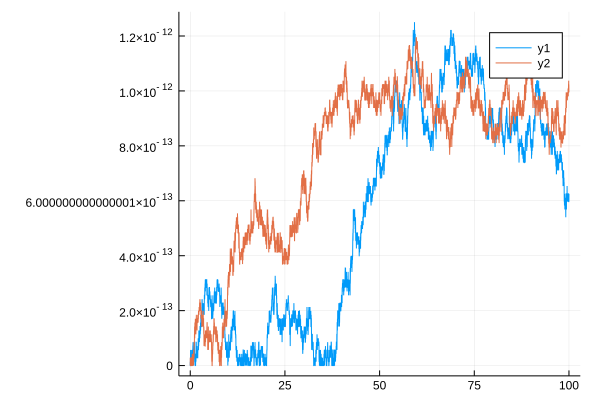

In [29]:
plot(s1_1.t, energy_err(s1_1))
plot!(s1_2.t, energy_err(s1_2,p0=p0.+d0/2,q0=q0.+d0/2))

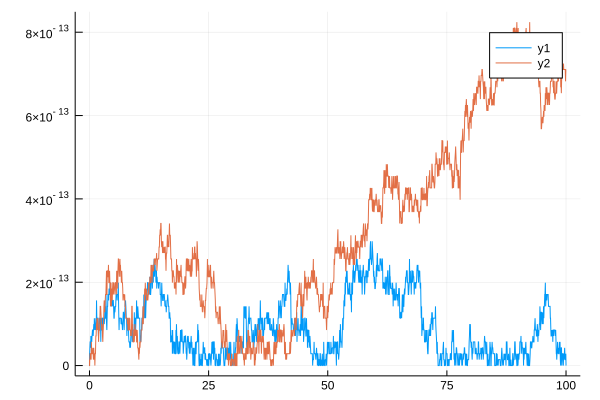

In [30]:
plot(s2_1.t, energy_err(s2_1))
plot!(s2_2.t, energy_err(s2_2,p0=p0.+d0/2,q0=q0.+d0/2))

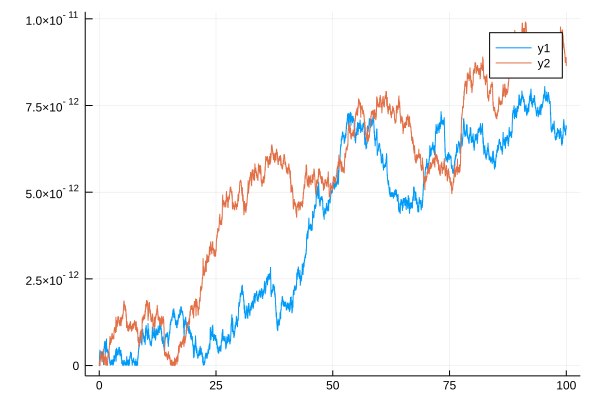

In [31]:
plot(s3_1.t, energy_err(s3_1))
plot!(s3_2.t, energy_err(s3_2,p0=p0.+d0/2,q0=q0.+d0/2))

We can now compare the integration solution as an extended system with the individual solutions.

1st trajectory: 1.4210854715202004e-12 vs 1.2505552149377763e-12
2nd trajectory: 7.389644451905042e-13 vs 1.1937117960769683e-12


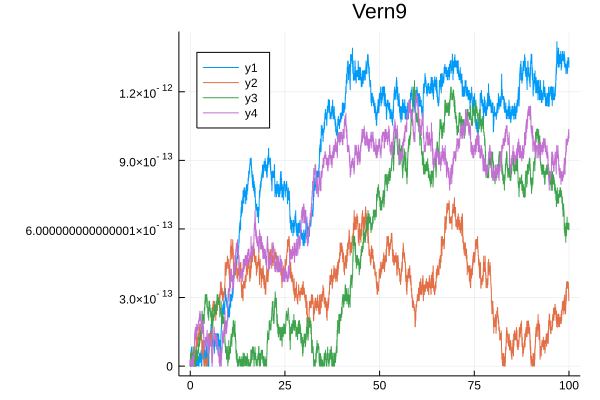

In [32]:
println("1st trajectory: ", maximum(energy_err(s1)), " vs ", maximum(energy_err(s1_1)))
println("2nd trajectory: ", maximum(energy_err2(s1)), " vs ", maximum(energy_err(s1_2,p0=p0.+d0/2,q0=q0.+d0/2)))

plot(s1.t, energy_err(s1), legend=:topleft, title="Vern9")
plot!(s1.t, energy_err2(s1))
plot!(s1_1.t, energy_err(s1_1))
plot!(s1_2.t, energy_err(s1_2,p0=p0.+d0/2,q0=q0.+d0/2))

1st trajectory: 6.394884621840902e-13 vs 2.984279490192421e-13
2nd trajectory: 6.394884621840902e-13 vs 8.242295734817162e-13


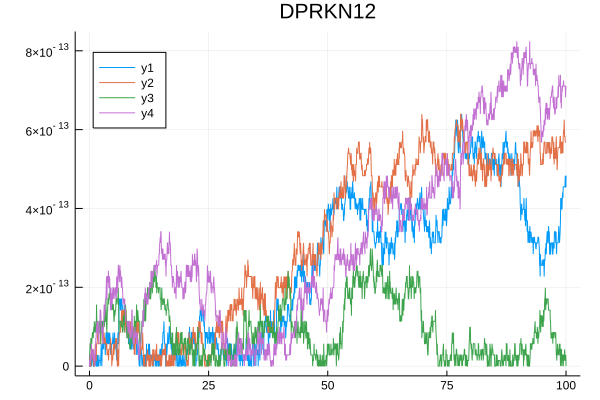

In [33]:
println("1st trajectory: ", maximum(energy_err_split(s2)), " vs ", maximum(energy_err(s2_1)))
println("2nd trajectory: ", maximum(energy_err_split2(s2)), " vs ", maximum(energy_err(s2_2,p0=p0.+d0/2,q0=q0.+d0/2)))

plot(s2.t, energy_err_split(s2), legend=:topleft, title="DPRKN12")
plot!(s2.t, energy_err_split2(s2))
plot!(s2_1.t, energy_err(s2_1))
plot!(s2_2.t, energy_err(s2_2,p0=p0.+d0/2,q0=q0.+d0/2))

1st trajectory: 8.043343768804334e-12 vs 8.043343768804334e-12
2nd trajectory: 9.904965736495797e-12 vs 9.904965736495797e-12


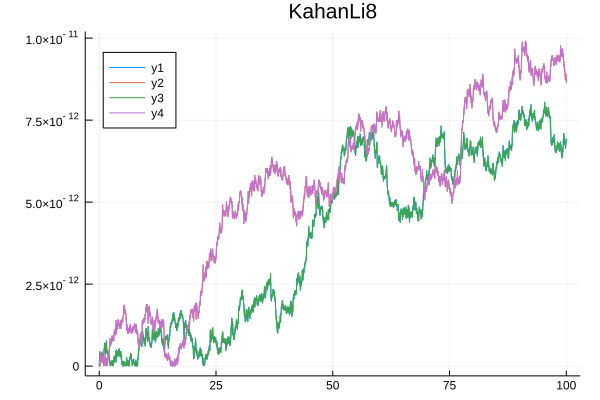

In [34]:
println("1st trajectory: ", maximum(energy_err_split(s3)), " vs ", maximum(energy_err(s3_1)))
println("2nd trajectory: ", maximum(energy_err_split2(s3)), " vs ", maximum(energy_err(s3_2,p0=p0.+d0/2,q0=q0.+d0/2)))

plot(s3.t, energy_err_split(s3), legend=:topleft, title="KahanLi8")
plot!(s3.t, energy_err_split2(s3))
plot!(s3_1.t, energy_err(s3_1))
plot!(s3_2.t, energy_err(s3_2,p0=p0.+d0/2,q0=q0.+d0/2))

1st trajectory: 1.2221335055073723e-12 vs 1.2505552149377763e-12
2nd trajectory: 1.2789769243681803e-12 vs 1.1937117960769683e-12


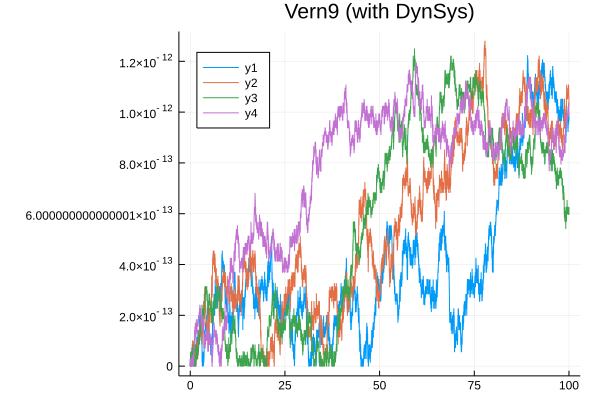

In [35]:
println("1st trajectory: ",
    maximum(abs.([H([s4.u[i][1][1], s4.u[i][1][2]], [s4.u[i][1][3], s4.u[i][1][4]], p) - H(p0,q0,p) for i in axes(s4,2)])),
    " vs ", maximum(energy_err(s1_1)))
println("2nd trajectory: ",
    maximum(abs.([H([s4.u[i][2][1], s4.u[i][2][2]], [s4.u[i][2][3], s4.u[i][2][4]], p) - H(p0.+d0/2,q0.+d0/2,p) for i in axes(s4,2)])),
    " vs ", maximum(energy_err(s1_2,p0=p0.+d0/2,q0=q0.+d0/2)))

plot([err(s4.t[i], s4.u[i][1][1], s4.u[i][1][2], s4.u[i][1][3], s4.u[i][1][4]) for i in axes(s4,2)], legend=:topleft, title="Vern9 (with DynSys)")
plot!([err2(s4.t[i], s4.u[i][2][1], s4.u[i][2][2], s4.u[i][2][3], s4.u[i][2][4]) for i in axes(s4,2)])
plot!(s1_1.t, energy_err(s1_1))
plot!(s1_2.t, energy_err(s1_2,p0=p0.+d0/2,q0=q0.+d0/2))

As expected we can see small differences in the energy error for the adaptive integrators and exactly the same behavior for the fixed timestep method, `KahanLi8`.

In [36]:
]st

    Status `C:\Users\memo\Documents\julia\Benchmarks\Project.toml`
  [6e4b80f9] BenchmarkTools v0.4.1
  [608a59af] ChaosTools v1.1.2
  [1dea7af3] OrdinaryDiffEq v4.13.0
  [d96e819e] Parameters v0.10.1
  [91a5bcdd] Plots v0.20.4
  [90137ffa] StaticArrays v0.8.3
  [37b6cedf] Traceur v0.2.0+ #master (https://github.com/MikeInnes/Traceur.jl.git)
  [37e2e46d] LinearAlgebra 


In [37]:
versioninfo()

Julia Version 1.0.1
Commit 0d713926f8 (2018-09-29 19:05 UTC)
Platform Info:
  OS: Windows (x86_64-w64-mingw32)
  CPU: Intel(R) Core(TM) i7-7800X CPU @ 3.50GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-6.0.0 (ORCJIT, skylake)
